# Universal noise

This notebook computes a universal noise pattern, which can be added to any image 
and missleads the open pose network 

In [1]:
%load_ext autoreload
%autoreload 2
# imports
import datetime
import logging
import os
import pathlib
import sys

import cv2
import numpy as np
import tensorflow as tf
from matplotlib import pyplot as plt
from tqdm import tqdm

from plot_utils import gen_plot_universal_noise, plot_pose
from tf_pose import common
from tf_pose.estimator import TfPoseEstimator
from tf_pose.networks import get_graph_path
from utils import load_batch
import wandb
import random

sys.path.insert(0, os.path.abspath('..'))
sys.path.insert(0, os.path.abspath('../..'))


os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"
logging.getLogger("tensorflow").setLevel(logging.CRITICAL)
logging.getLogger('TfPoseEstimatorRun').setLevel(logging.ERROR)
logging.getLogger('DeepExplain').setLevel(logging.ERROR)
logging.getLogger('TfPoseEstimator').setLevel(logging.ERROR)
logging.getLogger("wandb").setLevel(logging.ERROR)
random.seed(42)

/cluster/apps/python/3.7.1/x86_64/lib64/python3.7/site-packages/tensorflow/python/framework/dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/cluster/apps/python/3.7.1/x86_64/lib64/python3.7/site-packages/tensorflow/python/framework/dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/cluster/apps/python/3.7.1/x86_64/lib64/python3.7/site-packages/tensorflow/python/framework/dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/cluster/apps/python/3.7.1/x86_64/lib64/pyt

Using tf version = 1.13.1


In [3]:
# params 432, 368
IMAGE_WIDTH, IMAGE_HEIGHT = 432, 368
image_path_target = '../data/images/dri_target_far_2.jpg'
train_dir = '../data/cocoval2017Humans/train'
test_dir = '../data/cocoval2017Humans/test'
model = 'cmu'
log_dir = '../logs/'

run = wandb.init(
    project = "18_adv_universal_torch", 
    name = 'tensorflow',
    config={
        "epochs": 1,
        "epsilon": 5000,
        "batch_size": 16,
        "image_width": IMAGE_WIDTH,
        "image_height": IMAGE_HEIGHT,
    }
)

resize_out_ratio = 2.0
image_target = common.read_imgfile(image_path_target, IMAGE_WIDTH, IMAGE_HEIGHT)

training_paths = pathlib.Path(train_dir).glob('*.jpg')
training_paths = sorted([x for x in training_paths])
test_paths = pathlib.Path(test_dir).glob('*.jpg')
test_paths = sorted([x for x in test_paths])

wandb: Wandb version 0.8.30 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade
wandb: Network error resolved after 0:00:11.452875, resuming normal operation.


In [4]:
estimator = TfPoseEstimator(get_graph_path(
    model), target_size=(IMAGE_WIDTH, IMAGE_HEIGHT), trt_bool=False)
upsample_size = [int(estimator.target_size[1] / 8 * resize_out_ratio),
                 int(estimator.target_size[0] / 8 * resize_out_ratio)]
# get all outputs as np matrix
target_np, target_np_heat, target_np_paf, target_np_peaks = estimator.persistent_sess.run(
    [estimator.tensor_output, estimator.tensor_heatMat_up,
        estimator.tensor_pafMat_up, estimator.tensor_peaks],
    feed_dict={
        estimator.tensor_image: [image_target],
        estimator.upsample_size: upsample_size
    }
)

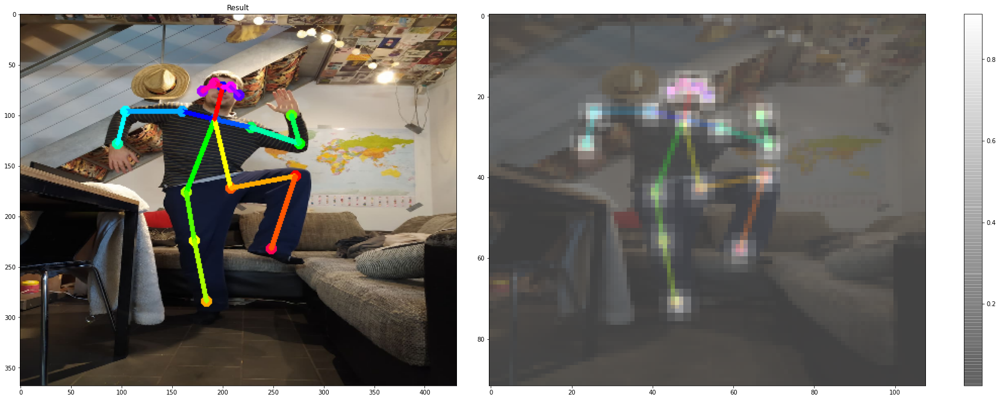

In [5]:
human_target = estimator.inference(
    image_target, resize_to_default=True, upsample_size=resize_out_ratio)
plot_pose(image_target, human_target, estimator.heatMat)

In [6]:
def multi_stage_loss_batch(estimator, target_heat, target_paf, start_stage=2):
    losses_per_stage = []
    # compute loss per stage
    for stage in range(start_stage, 7):
        paf_op = estimator.graph.get_operation_by_name(f'TfPoseEstimator/Mconv7_stage{stage}_L1/BiasAdd').outputs[0]
        heat_op = estimator.graph.get_operation_by_name(f'TfPoseEstimator/Mconv7_stage{stage}_L2/BiasAdd').outputs[0]

        # compute the loss for every channel
        loss_paf = tf.nn.l2_loss(tf.concat(paf_op, axis=-1) - tf.concat(target_paf, axis=-1), name='AX_loss_l1_stage%d_' % (stage))
        loss_heat = tf.nn.l2_loss(tf.concat(heat_op, axis=-1) - tf.concat(target_heat, axis=-1), name='AX_loss_l2_stage%d_' % (stage))
        losses_per_stage.append(tf.reduce_sum([loss_paf, loss_heat]))

    # combined loss form every stage
    total_loss = tf.reduce_sum(losses_per_stage)

    grad = tf.gradients(total_loss, estimator.tensor_image)[0]
    # compute the average
    grad = tf.reduce_mean(grad, 0)
    return grad, total_loss

In [7]:
STAGE_INDEX = 6  # range from 2 to 6


if not "training_stats" in vars():
    # where does the current batch start
    training_stats = {
        'batch_index': 0,
        'gobal_step': 0,
        'universal_noise': np.zeros(image_target.shape),
        'file_name': f'../snapshots/op_universal_noise_full_image.npy'
    }

target_heat = tf.compat.v1.placeholder(tf.float32, shape=(None, None, None, 19))
target_paf = tf.compat.v1.placeholder(tf.float32, shape=(None, None, None, 38))
grad_func, loss_func = multi_stage_loss_batch(estimator, target_heat, target_paf, STAGE_INDEX)

In [8]:
steps = int(len(training_paths) // run.config.batch_size)
print(f"{steps} per epoch")

250 per epoch


In [11]:
### ================= TRAINING ================= ###
for epoch in range(run.config.epochs):
    print(f"run {epoch + 1}/{run.config.epochs}")
    for i in tqdm(range(steps)):
        # load a batch
        batch, training_stats['batch_index'] = load_batch(
            training_paths, training_stats['batch_index'], wandb.config.batch_size)
        target_heat_batch = np.repeat(target_np[:, :, :, :19], wandb.config.batch_size, 0)
        target_paf_batch = np.repeat(target_np[:, :, :, 19:], wandb.config.batch_size, 0)

        repeated_noise = np.repeat(np.expand_dims(
            training_stats['universal_noise'], axis=0), wandb.config.batch_size, 0)
        batch_with_noise = batch + repeated_noise

        gradient, loss_val = estimator.persistent_sess.run(
            [grad_func, loss_func],
            feed_dict={
                target_heat: target_heat_batch,
                target_paf: target_paf_batch,
                estimator.tensor_image: batch_with_noise,
                estimator.upsample_size: upsample_size
            }
        )
        wandb.log({'loss': loss_val}, step=training_stats['gobal_step'])
        if i % 25 == 0:
            # save universal noise
            np.save(training_stats['file_name'], training_stats['universal_noise'])

        ### ================= UPDATE STEP ================= ###
        #adv_image = adv_image - EPS * np.sign(gradient[0])
        scaled_gradient = (run.config.epsilon * gradient)
        training_stats['universal_noise'] = training_stats['universal_noise'] - scaled_gradient
        training_stats['universal_noise'] = np.clip(training_stats['universal_noise'], 0, 255)

        training_stats['gobal_step'] += 1


  0%|          | 0/250 [00:00<?, ?it/s]

run 1/1


  0%|          | 1/250 [00:01<04:39,  1.12s/it]wandb: Wandb version 0.8.30 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade
100%|██████████| 250/250 [04:31<00:00,  1.09s/it]


In [12]:
training_stats['universal_noise'] = np.load(training_stats['file_name'])

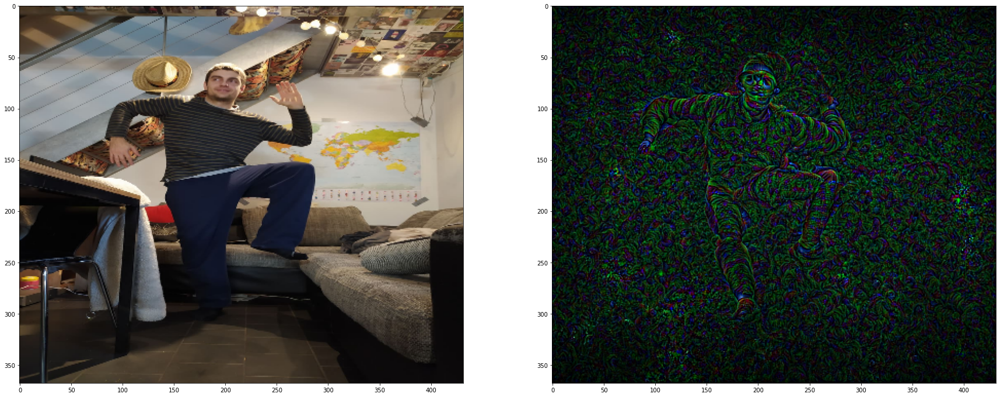

In [13]:
fig = plt.figure(figsize=(30, 30))
ax = fig.add_subplot(1, 2, 1)
ax.imshow(cv2.cvtColor(image_target, cv2.COLOR_BGR2RGB))
ax = fig.add_subplot(1, 2, 2)
ax.imshow(np.clip(training_stats['universal_noise'], 0, 255) / 255)

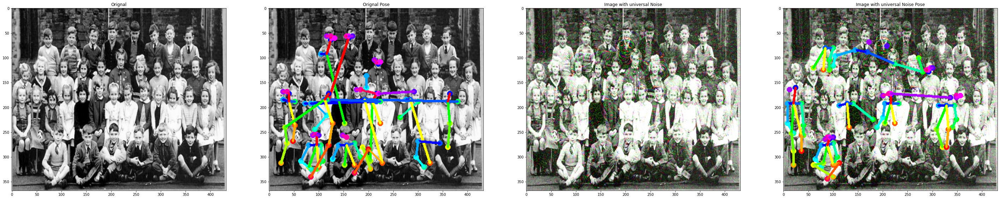

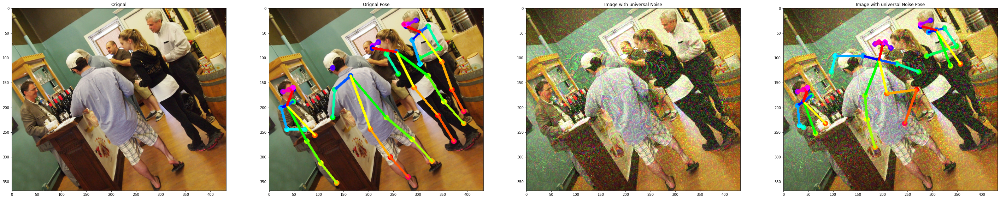

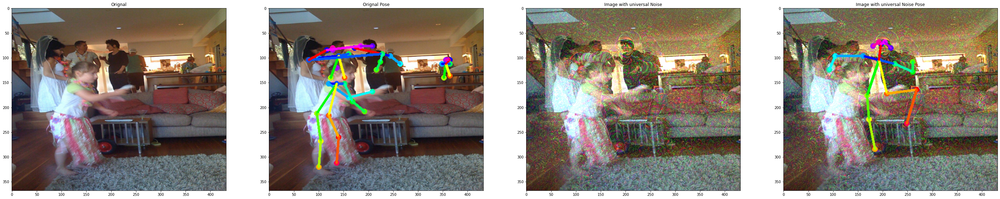

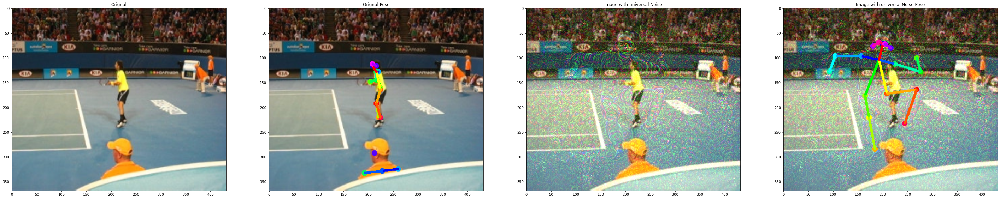

In [14]:
test_batch_size = 4
batch, batch_index = load_batch(test_paths, 0, test_batch_size)


for i, image in enumerate(batch):
    test_image = np.clip(image + training_stats['universal_noise'], 0, 255)
    detections = estimator.inference(
        image, resize_to_default=True, upsample_size=resize_out_ratio)
    detections_uni = estimator.inference(
        test_image, resize_to_default=True, upsample_size=resize_out_ratio)
    #plot_pose(test_image.astype(np.float32) / 255.0, detections, estimator.heatMat)

    detections_result = TfPoseEstimator.draw_humans(
        image, detections, imgcopy=True)
    detections_uni = TfPoseEstimator.draw_humans(
        test_image, detections_uni, imgcopy=True)

    fig = plt.figure(figsize=(50, 25))
    ax = fig.add_subplot(1, 4, 1)
    ax.set_title('Orignal')
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    ax = fig.add_subplot(1, 4, 2)
    ax.set_title('Orignal Pose')
    plt.imshow(cv2.cvtColor(detections_result, cv2.COLOR_BGR2RGB))

    ax = fig.add_subplot(1, 4, 3)
    ax.set_title('Image with universal Noise')
    plt.imshow(cv2.cvtColor(test_image.astype(
        np.float32) / 255.0, cv2.COLOR_BGR2RGB))

    ax = fig.add_subplot(1, 4, 4)
    ax.set_title('Image with universal Noise Pose')
    plt.imshow(cv2.cvtColor(detections_uni.astype(
        np.float32) / 255.0, cv2.COLOR_BGR2RGB))